In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import transforms, datasets
from tqdm.notebook import tqdm
import torch.optim as optim
import torch.nn as nn
from PIL import Image
import torchvision
from IPython.display import clear_output
import shutil
import torch
import os
import gc
import sys
import matplotlib.pyplot as plt

In [3]:
class LoadDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.transform = transform
        self.images = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

In [4]:
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hyperparameters
IMAGE_DIM = 128
num_epochs = 10
batch_size = 8
learning_rate = 1e-4

# Define transformations
transform = transforms.Compose([
    transforms.Resize((128, 128)),

    # Data augmentation
    #transforms.RandomHorizontalFlip(p=0.5),  # Randomly flip the image horizontally
    #transforms.RandomRotation(degrees=15),   # Random rotation of the image
    #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Randomly change brightness, contrast, and saturation

    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Initialize datasets
style_dataset = LoadDataset('/kaggle/input/best-artworks-of-all-time/images/images/Frida_Kahlo', transform)
full_dataset = datasets.ImageFolder('/kaggle/input/best-artworks-of-all-time/images/images/', transform)
idx = [i for i in range(len(full_dataset)) if 'Frida_Kahlo' not in full_dataset.imgs[i][0]]
content_dataset = Subset(full_dataset, idx)

# Initialize data loaders
style_loader = DataLoader(style_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
content_loader = DataLoader(content_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

In [5]:
def denormalisation(x):
    return x * 0.5 + 0.5

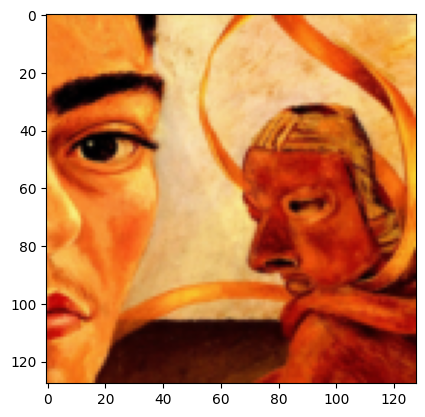

In [6]:
sample_s = style_dataset[0]
sample_s = denormalisation(sample_s)
plt.imshow(sample_s.swapaxes(0,2).swapaxes(0,1))

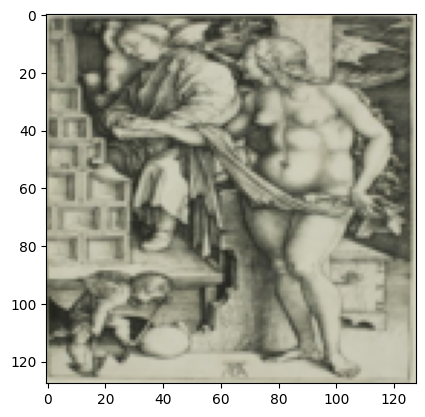

In [7]:
sample_c, _ = content_dataset[3]
sample_c = denormalisation(sample_c)
plt.imshow(sample_c.swapaxes(0,2).swapaxes(0,1))

In [8]:
class DownBlock(nn.Module):
    def __init__(self, inputs, outputs, kernel=4, stride=2, padding=1, norm=True, z_pad=False, is_last=False):
        super(DownBlock, self).__init__()
        self.conv = nn.Conv2d(inputs, outputs, kernel, stride, padding)
        self.leaky_relu = nn.LeakyReLU(0.2)
        self.instance_norm = nn.InstanceNorm2d(outputs)
        self.z_padding = nn.ZeroPad2d((1,0,1,0))
        self.flatten = nn.Flatten()
        self.sigmoid = nn.Sigmoid()
        self.norm = norm
        self.z_pad = z_pad
        self.is_last = is_last
        
    def forward(self, x):
        down_block = nn.Sequential(self.conv)
        if self.is_last:
            down_block.add_module('flatten', self.flatten)
            down_block.add_module('sigmoid', self.sigmoid)
        else:
            if self.norm:
                down_block.add_module('norm', self.instance_norm)
            down_block.add_module('leaky_relu', self.leaky_relu)
            if self.z_pad:
                down_block.add_module('z_padding', self.z_padding)
        return down_block(x)
        
class UpBlock(nn.Module):
    def __init__(self, inputs, outputs, kernel=4, stride=2, padding=1, norm=True, is_drop=False, is_last=False):
        super(UpBlock, self).__init__()
        self.conv_trans = nn.ConvTranspose2d(inputs, outputs, kernel, stride, padding)
        self.instance_norm = nn.InstanceNorm2d(outputs)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)
        self.tanh = nn.Tanh()
        self.norm = norm
        self.is_drop = is_drop
        self.is_last = is_last
        
    def forward(self, x):
        up_block = nn.Sequential(self.conv_trans)
        if self.is_last:
            up_block.add_module('tanh', self.tanh)
        else:
            if self.norm:
                up_block.add_module('norm', self.instance_norm)
            if self.is_drop:
                up_block.add_module('dropout', self.dropout)
            up_block.add_module('relu', self.relu)
        return up_block(x)

class ResidualBlock(nn.Module):
    def __init__(self, inputs, kernel=3, stride=1, padding=1):
        super(ResidualBlock, self).__init__()
        self.refl = nn.ReflectionPad2d(1)
        self.conv = nn.Conv2d(inputs, inputs, kernel, stride, padding)
        self.norm = nn.InstanceNorm2d(inputs)
        self.relu = nn.ReLU()
        
    def forward(self, x):
        residual_block = nn.Sequential(self.refl,
                                      self.conv,
                                      self.norm,
                                      self.relu,
                                      self.refl,
                                      self.conv,
                                      self.norm)
        return x + residual_block(x)
    
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        
        self.down_blocks = nn.ModuleList([DownBlock(3, 64, norm=False),  #128, 128, 64
                            DownBlock(64, 128),                          #64, 64, 128
                            DownBlock(128, 256),])                         #32, 32, 256
                           # DownBlock(256, 512),                         #16, 16, 512
                           # DownBlock(512, 512),                         #8, 8, 512 
                           # DownBlock(512, 512),                         #4, 4, 512
                           # DownBlock(512, 512)])                        #2, 2, 512
        
        self.residual_block = nn.ModuleList([ResidualBlock(256),
                                            ResidualBlock(256),
                                            ResidualBlock(256),
                                            ResidualBlock(256),
                                            ResidualBlock(256),
                                            ResidualBlock(256),
                                            ResidualBlock(256),])
        
        self.up_blocks = nn.ModuleList([#UpBlock(512, 512, is_drop=True),  #4, 4, 512  + 512
                         # UpBlock(1024, 512, is_drop=True),               #8, 8,  512   + 512
                         # UpBlock(1024, 512),                             #16, 16, 512  + 512
                         # UpBlock(1024, 256),                             #32, 32, 256  + 256
                          UpBlock(256, 128),                              #64, 64, 128  + 128
                          UpBlock(256, 64),                               #128, 128, 64  + 64 
                          UpBlock(128, 3)])                               #256, 256, 3
        
    def forward(self, x):
        skip_connections = []
        for block in self.down_blocks:
            x = block(x)
            skip_connections.append(x)
        skip_connections = reversed(skip_connections[:-1])
        
        for block, skip in zip(self.up_blocks[:-1], skip_connections):
            x = block(x)
            x = torch.cat([x, skip], axis=1)
        x = self.up_blocks[-1](x)
        return x
    
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.discrim_block = nn.ModuleList([
            DownBlock(3, 64, norm=False),       # 128, 128, 64
            DownBlock(64, 128),                 # 64, 64, 128
            DownBlock(128, 256, stride=4),      # 16, 16, 256
            DownBlock(256, 512, stride=4, z_pad=True),      # 4, 4, 512
            DownBlock(512, 1, stride=4, is_last=True)]     # 2, 2, 1   
        )
        
    def forward(self, x):
        for block in self.discrim_block:
            x = block(x)
        return x

In [9]:
def discriminator_loss(real, generated):
    loss = nn.MSELoss()
    real_loss = loss(real, torch.ones_like(real))
    generated_loss = loss(generated, torch.zeros_like(generated))
    return (real_loss + generated_loss) / 2

def generator_loss(generated):
    loss = nn.MSELoss()
    return loss(generated, torch.ones_like(generated))

def cycle_loss(real, cycled, LAMBDA):
    loss = torch.nn.L1Loss()
    return loss(real, cycled) * LAMBDA

def identity_loss(real, same, LAMBDA):
    loss = torch.nn.L1Loss()
    return loss(real, same) * LAMBDA

In [10]:
def weights_init_normal(x):
    classname = x.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(x.weight.data, 0.0, 0.02)
        if hasattr(x, 'bias') and x.bias is not None:
            torch.nn.init.constant_(x.bias.data, 0.0)
            

In [11]:
import itertools

style_generator = Generator()   #генерирует из фото контента стилизованное фото
content_generator = Generator() #генерирует из фото стиля фото в стиле контента
style_discriminator = Discriminator()  #отличает стилизованное фото от оригинального источника стиля
content_discriminator = Discriminator()  #отличает реальные фото от сгенерированных

model = {'style_gen': style_generator.to(device),
        'content_gen': content_generator.to(device),
        'style_discriminator': style_discriminator.to(device),
        'content_discriminator': content_discriminator.to(device)}

criterion = {
    'style_gen': generator_loss,
    'content_gen': generator_loss,
    'style_discriminator': discriminator_loss,
    'content_discriminator': discriminator_loss,
    'cycle_loss': cycle_loss,
    'identity_loss': identity_loss
}

optimizer = {'generator': optim.Adam(itertools.chain(
    model["style_gen"].parameters(), model["content_gen"].parameters()), 
                                          lr=1e-3, betas=(0.5, 0.999)),
             'style_discriminator': optim.Adam(model["style_discriminator"].parameters(), 
                                          lr=1e-3, betas=(0.5, 0.999)),
             'content_discriminator': optim.Adam(model["content_discriminator"].parameters(), 
                                          lr=1e-3, betas=(0.5, 0.999)),
            }

In [12]:
class LambdaLR:
    def __init__(self, n_epochs, offset, decay_start_epoch):
        assert (n_epochs - decay_start_epoch) > 0, "Decay must start before the training session ends!"
        self.n_epochs = n_epochs
        self.offset = offset
        self.decay_start_epoch = decay_start_epoch
        
    def step(self, epoch):
        return 1.0 - max(0, epoch+self.offset - self.decay_start_epoch)/(self.n_epochs - self.decay_start_epoch)

n_epochs = 50
epoch = 0
decay_epoch = 10


lr_scheduler_G = optim.lr_scheduler.LambdaLR(
    optimizer['generator'],
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

lr_scheduler_D_A = optim.lr_scheduler.LambdaLR(
    optimizer['style_discriminator'],
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)
lr_scheduler_D_B = optim.lr_scheduler.LambdaLR(
    optimizer['content_discriminator'],
    lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

In [13]:
def train(model, criterion, optimizer, epochs=10, batch_size = 8):
    
    sample_images, _ = next(iter(content_loader))
    torch.cuda.empty_cache()
    
    loss_style_d = []
    loss_content_d = []
    loss_style_g = []
    loss_content_g = []
    loss_c = []
    loss_i = []
    
    for epoch in range(epochs):
        loss_style_d_per_epoch = []
        loss_content_d_per_epoch = []
        loss_style_g_per_epoch = []
        loss_content_g_per_epoch = []
        loss_c_per_epoch = []
        loss_i_per_epoch = []
        
        real_score_per_epoch = []
        fake_score_per_epoch = []
        
        style_iterator = iter(style_loader)
        for real_content, _ in tqdm(content_loader):
            try:
                real_style = next(style_iterator)
            except StopIteration:
                style_iterator = iter(style_loader)
                real_style = next(style_iterator)
                
            model['style_gen'].train()
            model['content_gen'].train()
            model['style_discriminator'].eval()
            model['content_discriminator'].eval()
            
            #обнуляем градиенты генераторов 
            optimizer['generator'].zero_grad()
            
                            
            #рассчитываем identity loss
            same_content = model['content_gen'](real_content.to(device))
            content_identity_loss = criterion['identity_loss'](real_content.to(device), same_content.to(device), LAMBDA=5.0)
            same_style = model['style_gen'](real_style.to(device))
            style_identity_loss = criterion['identity_loss'](real_style.to(device), same_style.to(device), LAMBDA=5.0)
            total_identity_loss = (content_identity_loss + style_identity_loss) / 2
            
            #рассчитываем GAN loss
            fake_style = model['style_gen'](real_content.to(device))
            disc_fake_style = model['style_discriminator'](fake_style)            
            fake_content = model['content_gen'](real_style.to(device))
            disc_fake_content = model['content_discriminator'](fake_content)

            content_gen_loss = criterion['content_gen'](disc_fake_content)
            style_gen_loss = criterion['style_gen'](disc_fake_style)
            
            #рассчитываем cycle_loss
            cycled_content = model['content_gen'](fake_style)
            cycled_style = model['style_gen'](fake_content)
            total_cycle_loss = (criterion['cycle_loss'](real_content.to(device), cycled_content.to(device), LAMBDA=10) + criterion['cycle_loss'](real_style.to(device), cycled_style.to(device), LAMBDA=10)) / 2
            
            #оцениваем общие lossы генераторов
            total_cont_gen_loss = content_gen_loss + total_cycle_loss + content_identity_loss
            total_style_gen_loss = style_gen_loss + total_cycle_loss + style_identity_loss
            total_gen_loss = content_gen_loss + style_gen_loss + total_cycle_loss + total_identity_loss
            
            total_gen_loss.backward()
            optimizer['generator'].step()
            
            #total_cont_gen_loss.backward(retain_graph=True)
            #optimizer['content_gen'].step()
            
            #total_style_gen_loss.backward(retain_graph=True)
            #optimizer['style_gen'].step()
            
            #тренируем дискриминатор стиля
            model['style_discriminator'].train()
            optimizer['style_discriminator'].zero_grad()
            disc_fake_style = model['style_discriminator'](fake_style.detach().to(device))
            disc_real_style = model['style_discriminator'](real_style.to(device))
            style_disc_loss = criterion['style_discriminator'](disc_real_style, disc_fake_style)
            
            style_disc_loss.backward()
            optimizer['style_discriminator'].step()
            
            #тренируем дискриминатор контента
            model['content_discriminator'].train()
            optimizer['content_discriminator'].zero_grad()
            disc_fake_content = model['content_discriminator'](fake_content.detach().to(device)) 
            disc_real_content = model['content_discriminator'](real_content.to(device))  
            content_disc_loss = criterion['content_discriminator'](disc_real_content, disc_fake_content)
            
            content_disc_loss.backward()
            optimizer['content_discriminator'].step()            
            

            
            loss_content_d_per_epoch.append(content_disc_loss.cpu().detach().numpy())
            loss_style_d_per_epoch.append(style_disc_loss.cpu().detach().numpy())
            loss_content_g_per_epoch.append(total_cont_gen_loss.cpu().detach().numpy())
            loss_style_g_per_epoch.append(total_style_gen_loss.cpu().detach().numpy())
            loss_c_per_epoch.append(total_cycle_loss.cpu().detach().numpy())
            loss_i_per_epoch.append(total_identity_loss.cpu().detach().numpy())
            
            
        loss_content_d.append(loss_content_d_per_epoch)
        loss_style_d.append(loss_style_d_per_epoch)
        loss_content_g.append(loss_content_g_per_epoch)
        loss_style_g.append(loss_style_g_per_epoch)
        loss_c.append(loss_c_per_epoch)
        loss_i.append(loss_i_per_epoch)
        
        model['style_gen'].eval()
        epoch_images = model['style_gen'](sample_images.to(device))
        
        
        plt.figure(figsize=(20,7))
        for i in range(8):
            plt.subplot(2, 8, i+1)
            plt.imshow(denormalisation(sample_images[i].cpu().detach().numpy().swapaxes(0,2).swapaxes(0,1)))
            plt.subplot(2, 8, i+9)
            plt.imshow(denormalisation(epoch_images[i].cpu().detach().numpy().swapaxes(0,2).swapaxes(0,1)))
        plt.show()
        
        print(
                "\r[Epoch %d/%d] [Style_gen_loss: %.2f (%.2f) Style_disc_loss: %.2f (%.2f) Content_gen_loss: %.2f (%.2f) Content_disc_loss: %.2f (%.2f) Cycle_loss: %.2f (%.2f) Identity_loss: %.2f (%.2f)]"
                %(
                    epoch + 1,
                    epochs,
                    np.mean(loss_style_g_per_epoch),
                    np.mean(loss_style_g),
                    np.mean(loss_style_d_per_epoch),
                    np.mean(loss_style_d),
                    np.mean(loss_content_g_per_epoch),
                    np.mean(loss_content_g),
                    np.mean(loss_content_d_per_epoch),
                    np.mean(loss_content_d),
                    np.mean(loss_c_per_epoch),
                    np.mean(loss_c),
                    np.mean(loss_i_per_epoch),
                    np.mean(loss_i)

                )
            )
        #clear_output(wait=True)     
        
        #torch.save(model.state_dict(), f'epoch_{i}.pth'.format(epoch))
        
    return model, loss_style_d, loss_content_d, loss_style_g, loss_content_g, loss_c, loss_i
        

  0%|          | 0/1081 [00:00<?, ?it/s]

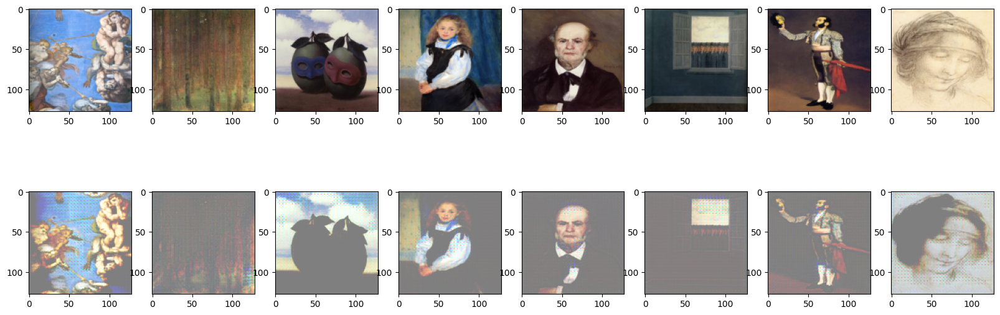

[Epoch 1/50] [Style_gen_loss: 7.45 (7.45) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 7.04 (7.04) Content_disc_loss: 0.01 (0.01) Cycle_loss: 4.17 (4.17) Identity_loss: 2.09 (2.09)]


  0%|          | 0/1081 [00:00<?, ?it/s]

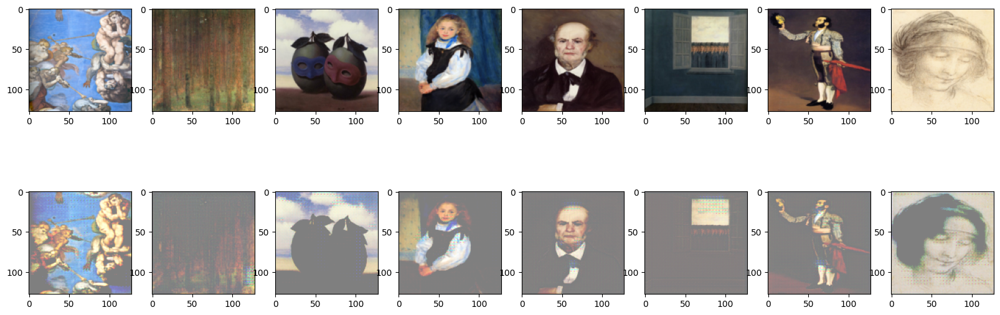

[Epoch 2/50] [Style_gen_loss: 7.04 (7.24) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.60 (6.82) Content_disc_loss: 0.00 (0.01) Cycle_loss: 3.88 (4.02) Identity_loss: 1.95 (2.02)]


  0%|          | 0/1081 [00:00<?, ?it/s]

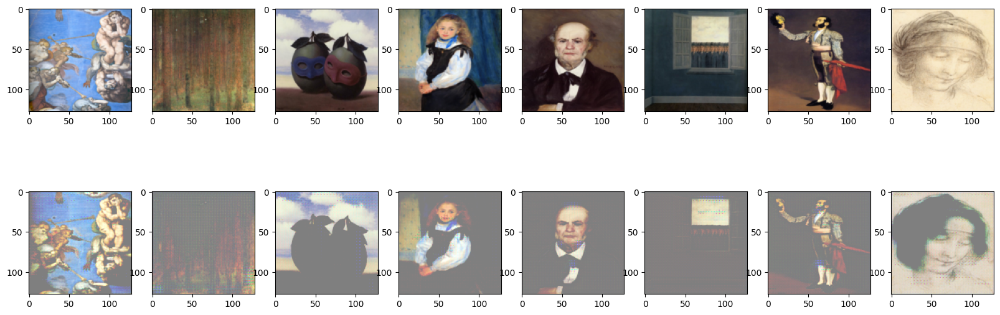

[Epoch 3/50] [Style_gen_loss: 6.92 (7.14) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.48 (6.71) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.80 (3.95) Identity_loss: 1.91 (1.98)]


  0%|          | 0/1081 [00:00<?, ?it/s]

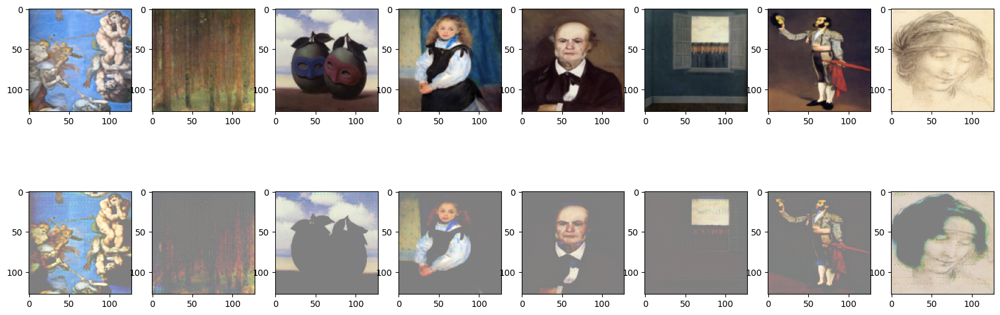

[Epoch 4/50] [Style_gen_loss: 6.86 (7.07) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.42 (6.64) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.76 (3.90) Identity_loss: 1.88 (1.96)]


  0%|          | 0/1081 [00:00<?, ?it/s]

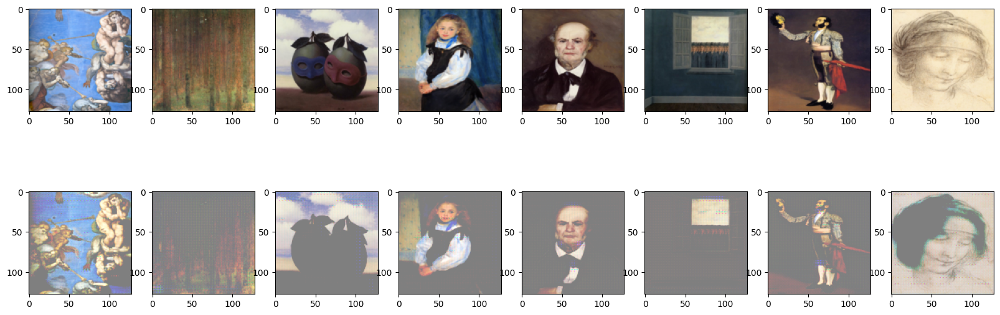

[Epoch 5/50] [Style_gen_loss: 6.82 (7.02) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.37 (6.58) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.73 (3.87) Identity_loss: 1.87 (1.94)]


  0%|          | 0/1081 [00:00<?, ?it/s]

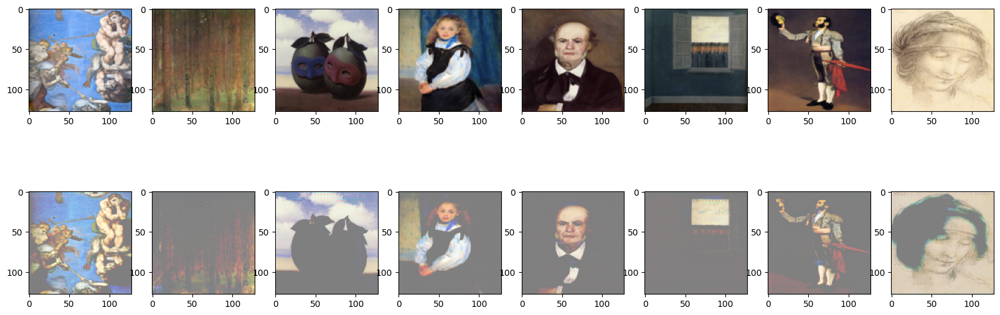

[Epoch 6/50] [Style_gen_loss: 6.79 (6.98) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.34 (6.54) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.71 (3.84) Identity_loss: 1.86 (1.93)]


  0%|          | 0/1081 [00:00<?, ?it/s]

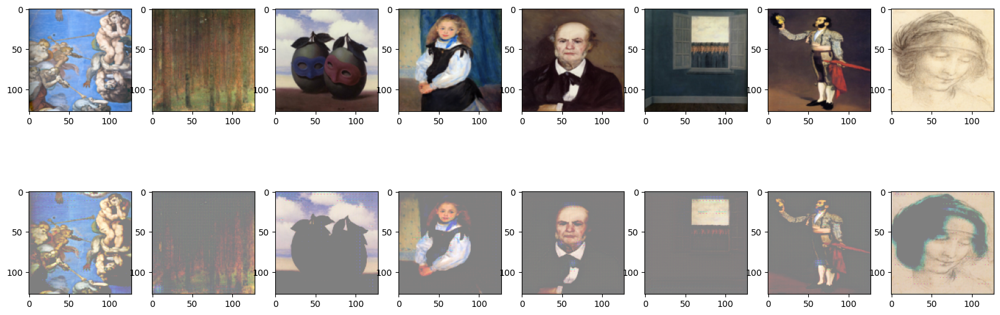

[Epoch 7/50] [Style_gen_loss: 6.77 (6.95) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.32 (6.51) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.69 (3.82) Identity_loss: 1.85 (1.91)]


  0%|          | 0/1081 [00:00<?, ?it/s]

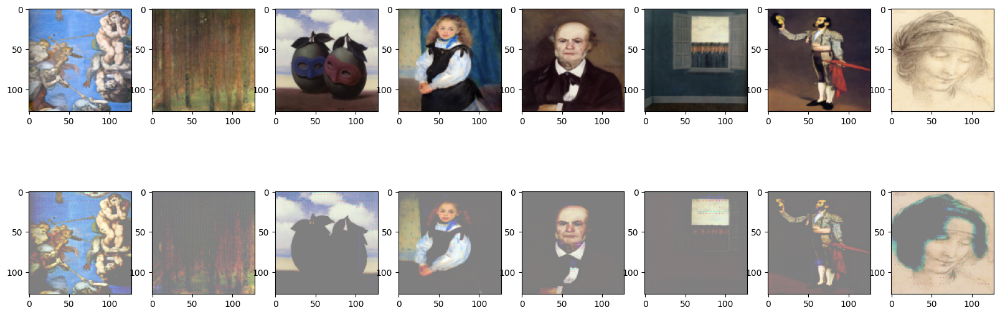

[Epoch 8/50] [Style_gen_loss: 6.75 (6.93) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.30 (6.48) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.68 (3.80) Identity_loss: 1.84 (1.91)]


  0%|          | 0/1081 [00:00<?, ?it/s]

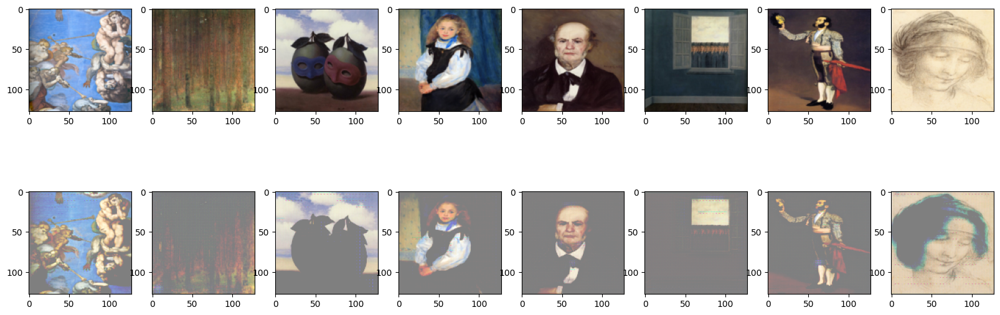

[Epoch 9/50] [Style_gen_loss: 6.74 (6.91) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.28 (6.46) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.67 (3.79) Identity_loss: 1.84 (1.90)]


  0%|          | 0/1081 [00:00<?, ?it/s]

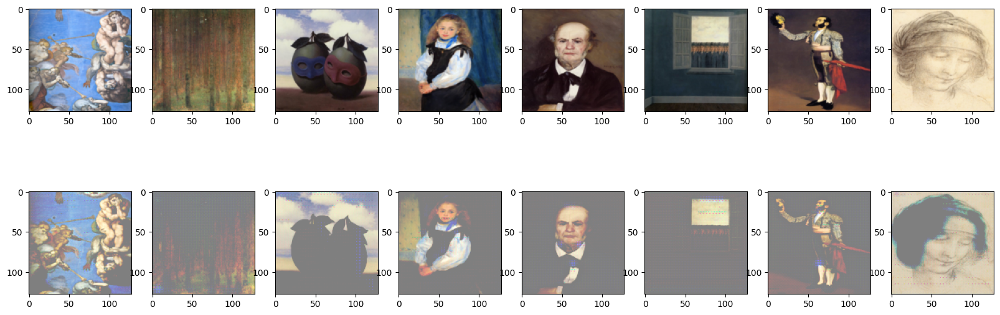

[Epoch 10/50] [Style_gen_loss: 6.73 (6.89) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.27 (6.44) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.66 (3.78) Identity_loss: 1.83 (1.89)]


  0%|          | 0/1081 [00:00<?, ?it/s]

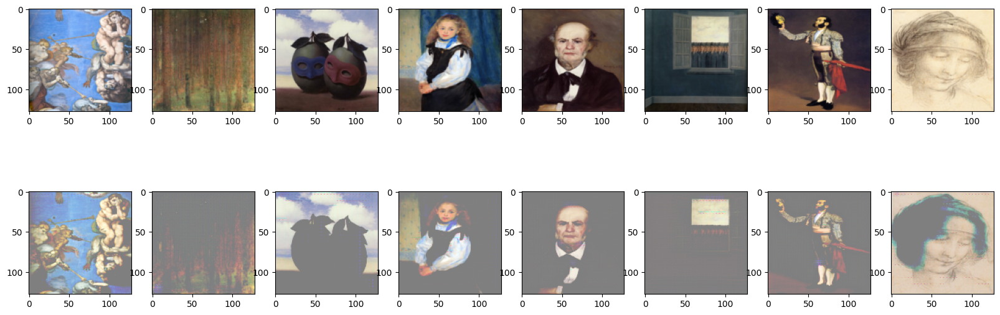

[Epoch 11/50] [Style_gen_loss: 6.72 (6.87) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.26 (6.43) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.66 (3.76) Identity_loss: 1.83 (1.89)]


  0%|          | 0/1081 [00:00<?, ?it/s]

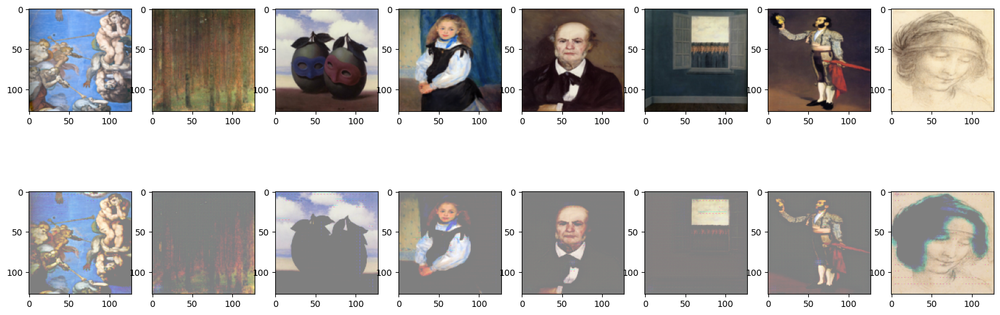

[Epoch 12/50] [Style_gen_loss: 6.71 (6.86) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.25 (6.41) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.65 (3.76) Identity_loss: 1.83 (1.88)]


  0%|          | 0/1081 [00:00<?, ?it/s]

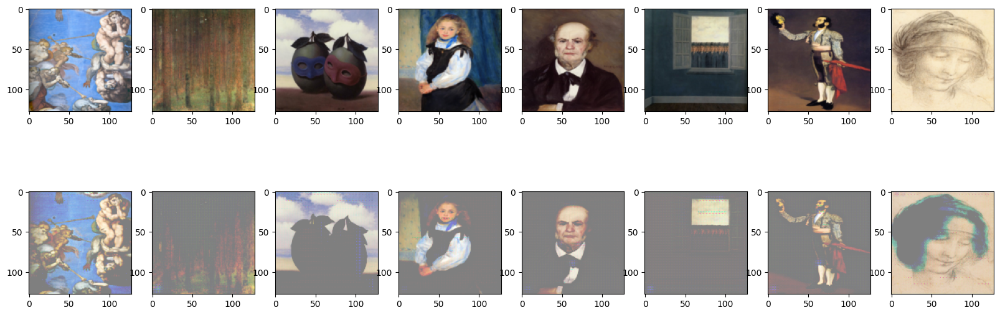

[Epoch 13/50] [Style_gen_loss: 6.70 (6.85) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.25 (6.40) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.65 (3.75) Identity_loss: 1.83 (1.88)]


  0%|          | 0/1081 [00:00<?, ?it/s]

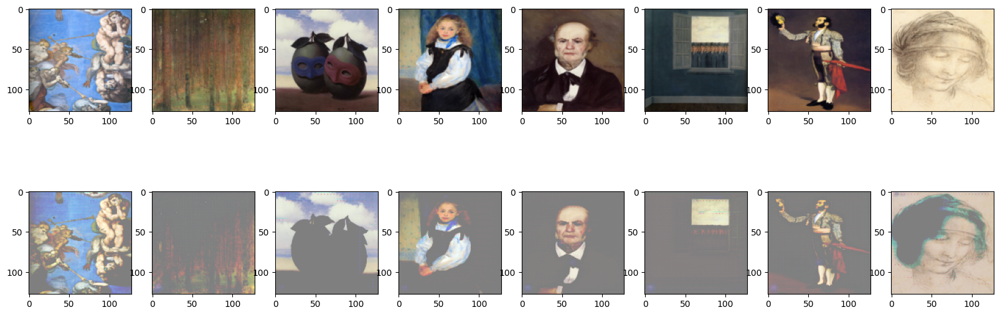

[Epoch 14/50] [Style_gen_loss: 6.70 (6.84) Style_disc_loss: 0.00 (0.00) Content_gen_loss: 6.24 (6.39) Content_disc_loss: 0.00 (0.00) Cycle_loss: 3.64 (3.74) Identity_loss: 1.82 (1.87)]


  0%|          | 0/1081 [00:00<?, ?it/s]

In [ ]:
model, loss_style_d, loss_content_d, loss_style_g, loss_content_g, loss_c, loss_i = train(model, criterion, optimizer, epochs=50)

In [ ]:
torch.save(model['style_gen'].state_dict(), 'style_generator.pth')
torch.save(model['content_gen'].state_dict(), 'content_generator.pth')
torch.save(model['style_discriminator'].state_dict(), 'style_discriminator.pth')
torch.save(model['content_discriminator'].state_dict(), 'content_discriminator.pth')